<div style="width: 100%; overflow: hidden;">
    <div style="width: 150px; float: left;"> <img src="data/D4Sci_logo_ball.png" alt="Data For Science, Inc" align="left" border="0"> </div>
    <div style="float: left; margin-left: 10px;"> 
        <h1>Data Visualization</h1>
        <h1>Mapping</h1>
        <p>Bruno Gonçalves<br/>
        <a href="http://www.data4sci.com/">www.data4sci.com</a><br/>
        @bgoncalves, @data4sci</p></div>
</div>

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
import matplotlib.image as mpimg

import PIL

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import json

import cartopy
import cartopy.crs as ccrs

import watermark

%load_ext watermark
%matplotlib inline

In [2]:
%watermark -n -v -m -g -iv

Python implementation: CPython
Python version       : 3.11.7
IPython version      : 8.12.3

Compiler    : Clang 14.0.6 
OS          : Darwin
Release     : 23.6.0
Machine     : arm64
Processor   : arm
CPU cores   : 16
Architecture: 64bit

Git hash: 33b433457a445de9c142605b42f2352498607222

matplotlib: 3.8.0
cartopy   : 0.22.0
PIL       : 10.2.0
pandas    : 2.2.3
numpy     : 1.26.4
watermark : 2.4.3
json      : 2.0.9



In [3]:
!pwd

/Users/bgoncalves/DataForScience/Visualization_LL


In [4]:
plt.style.use('d4sci.mplstyle')

## Block map

We're going to build up a block map of the number of cases in each state. We start by loading up the most recent data frrom the JHU github repository

In [5]:
confirmed_US = pd.read_csv('data/time_series_covid19_confirmed_US.csv')

And clean it up so that we have just totals per state

In [6]:
confirmed_US.head()

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,19732,19759,19759,19759,19759,19759,19759,19759,19790,19790
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,69641,69767,69767,69767,69767,69767,69767,69767,69860,69860
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,7451,7474,7474,7474,7474,7474,7474,7474,7485,7485
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,8067,8087,8087,8087,8087,8087,8087,8087,8091,8091
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,18616,18673,18673,18673,18673,18673,18673,18673,18704,18704


In [7]:
del_columns = [
 'UID',
 'iso2',
 'iso3',
 'code3',
 'FIPS',
 'Admin2',
 'Country_Region',
 'Lat',
 'Long_',
 'Combined_Key',
]

In [8]:
confirmed_US.drop(columns=del_columns, inplace=True)
confirmed_US = confirmed_US.groupby('Province_State').sum().T
confirmed_US.index = pd.to_datetime(confirmed_US.index)
confirmed_US = confirmed_US.diff(1).rolling(7).mean()

So we finally have:

In [9]:
confirmed_US

Province_State,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Diamond Princess,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
2020-01-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-05,530.571429,64.285714,0.0,809.0,213.428571,3447.142857,436.000000,191.142857,65.857143,0.0,...,-23.571429,2802.000000,243.428571,0.0,3.285714,747.714286,642.142857,502.000000,643.142857,49.000000
2023-03-06,530.571429,64.285714,0.0,809.0,213.428571,3443.714286,440.428571,176.285714,65.857143,0.0,...,-197.857143,2756.142857,243.428571,0.0,4.000000,747.714286,642.142857,502.000000,615.142857,49.000000
2023-03-07,530.571429,83.142857,0.0,809.0,226.285714,3336.000000,440.428571,152.714286,65.857143,0.0,...,-351.428571,2719.428571,243.428571,0.0,4.142857,644.285714,642.142857,502.000000,618.857143,32.285714
2023-03-08,353.000000,83.142857,0.0,460.0,267.142857,3336.000000,438.428571,155.571429,0.000000,0.0,...,280.285714,1784.285714,243.428571,163.0,3.428571,644.428571,0.000000,243.714286,596.857143,32.285714


We load up the information on the state location for our block map. The x and y coordinates correspond to the location of the states in our map.

In [10]:
states = pd.read_csv('data/states.csv', index_col=0)
states.head()

,x,y,name
index,,,
AL,7,6,Alabama
AK,0,1,Alaska
AZ,2,5,Arizona
AR,5,5,Arkansas
CA,1,4,California


And rename the columns to use the state abbreviations for simplicity

In [11]:
col_dict = dict(states.reset_index()[['name', 'index']].values)
confirmed_US.rename(columns=col_dict, inplace=True)

And finally we can make our plot

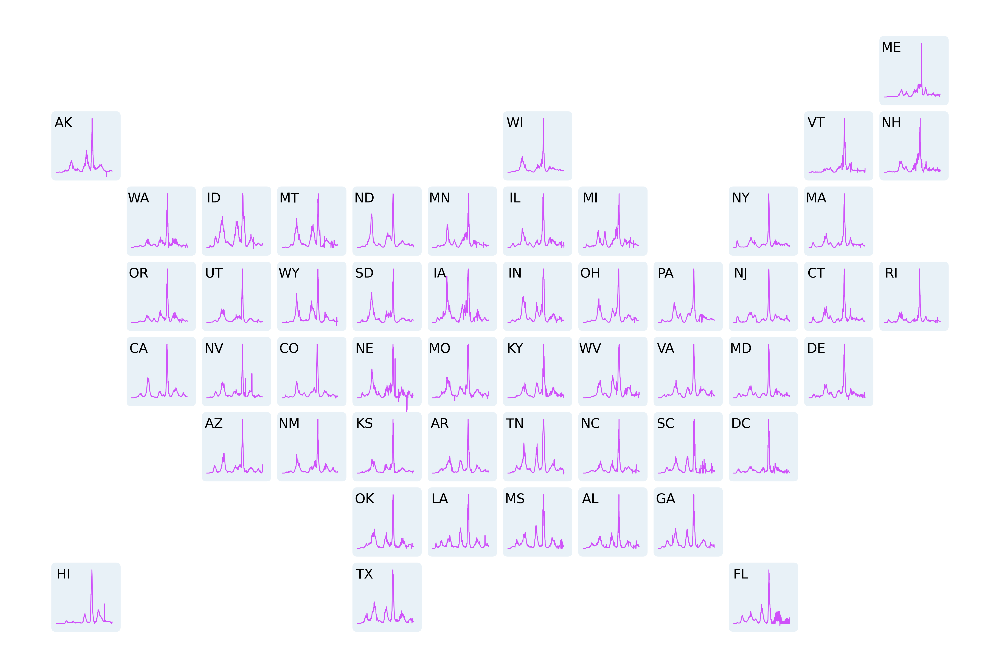

In [ ]:
fig, ax = plt.subplots(1, figsize=(16, 22))
ax.set_aspect(1.)
ax.invert_yaxis()

# Each state will be represented by a "FancyBox" patch
patches = []

for state in states.index:
    fancybox = mpatches.FancyBboxPatch([states.x[state]-0.5, states.y[state]-0.5], 0.8, 0.8,
        boxstyle=mpatches.BoxStyle("Round", pad=0.06))
    patches.append(fancybox)

# Add the patches to the plot
collection = PatchCollection(patches, facecolors='#1f77b4', alpha=0.1)
ax.add_collection(collection)

# Finally add the timelines for each state at the corresponding location
x = np.linspace(0., 0.75, confirmed_US.shape[0])

for state in states.index:
    # Timelines are normalized so that they fit within the fancy box.
    timeline = (confirmed_US[state]/(confirmed_US[state].max()*1.4)).fillna(0).values
    
    ax.text(y=states.y[state]-0.4, x=states.x[state]-0.4, 
            s=state, horizontalalignment='center', verticalalignment='center', 
            fontsize=15)
    ax.plot(states.x[state]+x-0.5, states.y[state]-timeline+0.25, lw=1, color='#cf51f9')
ax.axis('off')
fig.tight_layout()

## Manhattan

We are going to use some geographical boundary information for the borough of Manhattan. For simplicity I've extracted the necessary data from the official shapefiles https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm. In this format the data can be easily loaded:

In [13]:
manhattan = json.loads(open("data/Manhattan.json", "rt").readline())

points = np.array(manhattan["points"])
parts = manhattan["parts"]

The data (similarly to shapefiles) is composed of a list of 2D points:

In [14]:
points

array([[-74.01092841,  40.68449147],
       [-74.0119326 ,  40.68388775],
       [-74.01217597,  40.68409519],
       ...,
       [-73.90682823,  40.87663155],
       [-73.90682004,  40.87658553],
       [-73.906651  ,  40.8757525 ]])

And indicators of which points belong to which line.

In [15]:
parts

[0,
 12,
 17,
 22,
 27,
 75,
 81,
 362,
 369,
 377,
 388,
 393,
 399,
 429,
 440,
 447,
 455,
 463,
 474,
 483,
 488,
 493,
 501,
 534,
 542,
 560,
 728,
 758,
 1004,
 6091,
 6104,
 6332,
 6332,
 6332]

This means that the first line is made up of points in position $[0:12)$, the second line of the points $[12:17)$, etc. We can now use this data to easily get a quick map of Manhattan. I've purposefully let matplotlib set the color for each individual line so that we can easily see the different parts of the figure

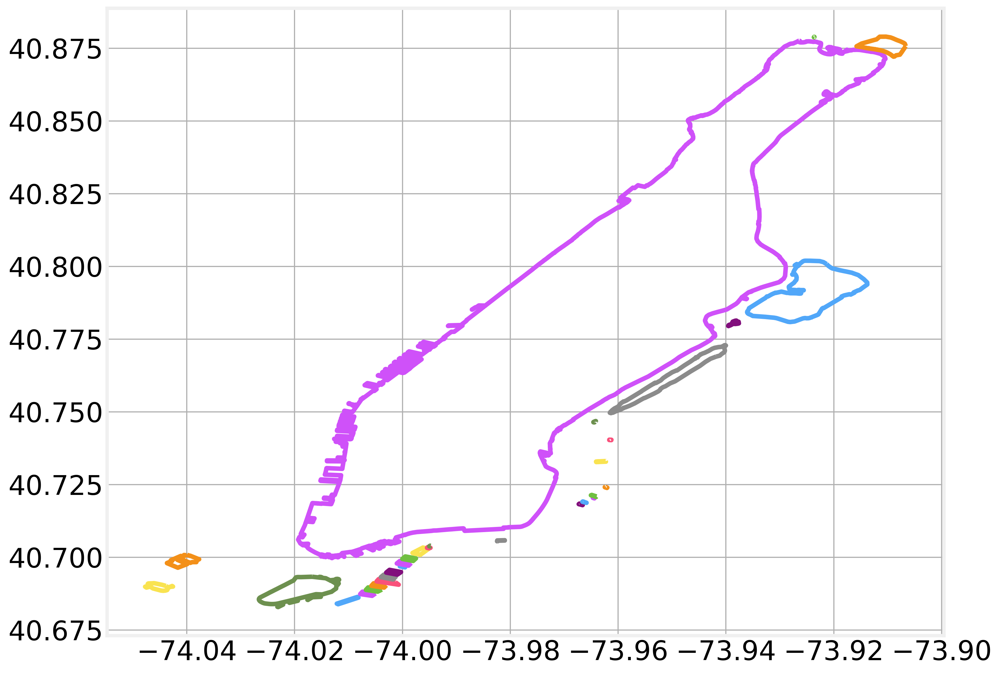

In [16]:
for i in range(len(parts)-1):
	plt.plot(points.T[0][parts[i]:parts[i+1]], points.T[1][parts[i]:parts[i+1]])

Let's add some points stored in a csv file of x, y coordinates

In [17]:
tweets = pd.read_csv('data/tweets.csv')

These are coordinates of real people tweeting with GPS locations enabled on a specific day:

In [18]:
tweets.head()

,X,Y
0,-73.997017,40.762337
1,-73.968542,40.780709
2,-73.985962,40.760342
3,-73.952610,40.810797
4,-73.968542,40.780709


We can now easily plot these points along side the geographical boundaries

In [19]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

(-74.05478355854918, -73.89959706381602, 40.673110890352014, 40.88884410240033)

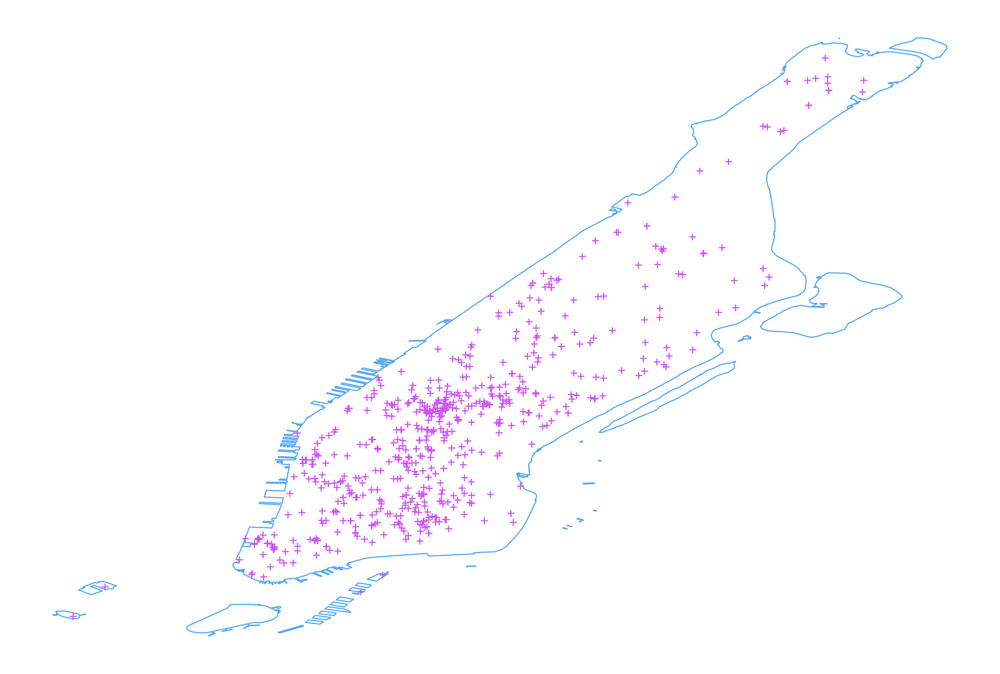

In [20]:
for i in range(len(parts)-1):
	plt.plot(points.T[0][parts[i]:parts[i+1]], 
             points.T[1][parts[i]:parts[i+1]], '-', c=colors[0], lw=1)

plt.plot(tweets['X'], tweets['Y'], '+', c=colors[1])
plt.axis('off')

## Population matrix

Another common format for data is what is known as "raster" file. These are essentially matricies of numbers along with some metadata. Let's take a look at the US population in 2015 according to Columbia's Gridded Population of the World project https://sedac.ciesin.columbia.edu/data/collection/gpw-v4

In [21]:
data = np.loadtxt('data/US_pop.mat')

As you can see this is just a matrix of numbers. nan's are used to denote missing data

In [22]:
data.shape

(119, 246)

In [23]:
data[50,:]

array([           nan,            nan,            nan,            nan,
                  nan,            nan,            nan,            nan,
                  nan,            nan,            nan, 1.43647803e+03,
       9.37134521e+02, 7.71265198e+02, 7.78246277e+02, 7.79848511e+02,
       3.08748901e+03, 2.14585605e+04, 4.40342695e+04, 3.14356094e+04,
       4.37279590e+03, 1.89785803e+03, 6.52430420e+03, 1.37475195e+03,
       1.79528894e+03, 1.61386096e+03, 1.17168201e+03, 1.01398602e+03,
       9.70716187e+02, 2.07381699e+02, 1.24349003e+01, 6.72574186e+00,
       2.57071710e+00, 1.25912104e+01, 1.28034401e+01, 1.30428400e+01,
       2.85179405e+01, 2.97565594e+01, 2.97565594e+01, 5.72180710e+01,
       1.06223701e+02, 1.02709297e+02, 9.62921829e+01, 1.12264000e+02,
       1.12264000e+02, 1.12264000e+02, 1.12264000e+02, 1.12264000e+02,
       1.12264000e+02, 1.18276497e+02, 1.45015793e+02, 1.45103897e+02,
       1.45133194e+02, 1.45294296e+02, 1.45463104e+02, 1.90916702e+02,
      

We can get a quick and dirty plot using imshow

In [24]:
data[data>0].max()

3825095.0

(-0.5, 245.5, 118.5, -0.5)

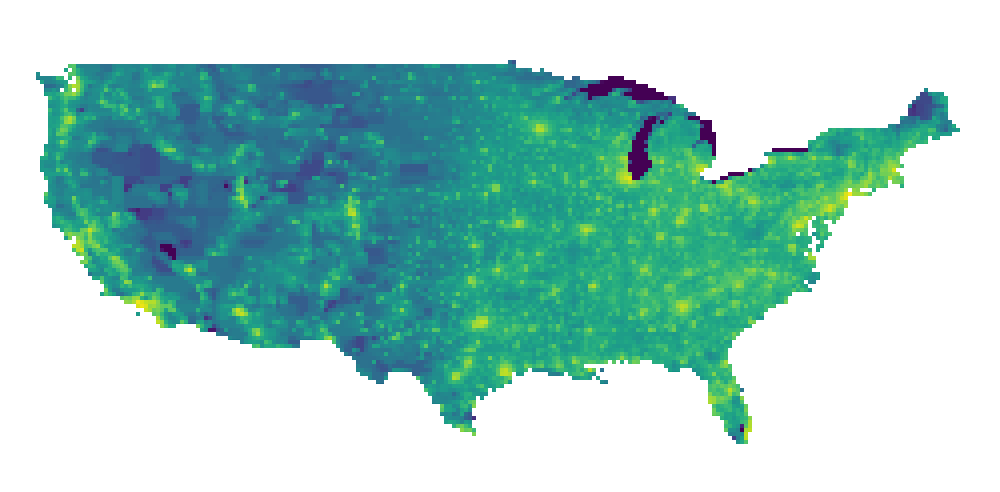

In [25]:
fig, ax = plt.subplots(1,1)
ax.imshow(np.log10(data+1))
ax.axis('off')

In addition to this data, we also need the coordinates of the lower left hand corner and the cell size

In [26]:
xllcorner = -126.5
yllcorner = 22.75
cellsize = 0.25

Using this metadata we can now convert between raw lat/lon and matrix coordinates

In [27]:
def map_points(xllcorner, yllcorner, cellsize, nrows, x, y):
    x = int((x-xllcorner)/cellsize)
    y = (nrows-1)-int((y-yllcorner)/cellsize)

    return x, y

Which is useful when we want to add point or lines to the plot

(-0.5, 245.5, 118.5, -0.5)

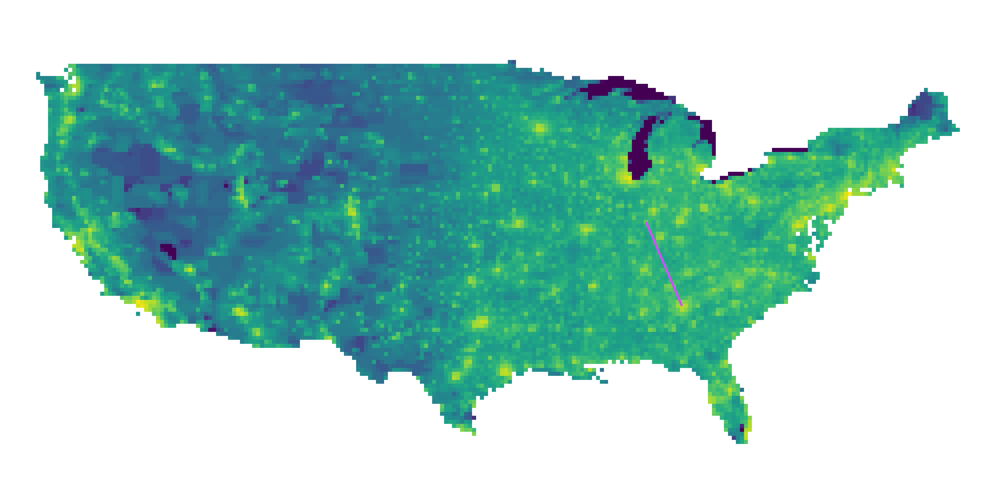

In [28]:
fig, ax = plt.subplots(1,1)
ax.imshow(np.log(data+1))

x1, y1 = map_points(xllcorner, yllcorner, cellsize, data.shape[0], 
                    -86.523435, 39.163355, )
x2, y2 = map_points(xllcorner, yllcorner, cellsize, data.shape[0], 
                    -84.404820, 33.761926, )

ax.plot([x1, x2], [y1, y2], '-', c=colors[1], lw=2)
ax.axis('off')

Add all the state boundaries https://www.usgs.gov/products/data-and-tools/gis-data in the same slightly massaged format as the Manhattan data above

(-0.5, 245.5, 118.5, -0.5)

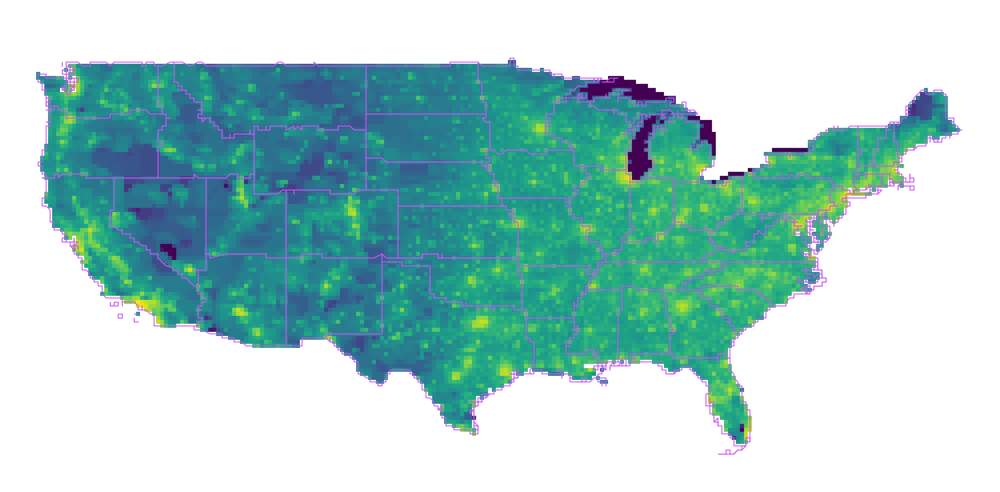

In [29]:
fig, ax = plt.subplots(1,1)
ax.imshow(np.log(data+1))

shapes = json.loads(open("data/48states.json", "rt").readline())

pos = None
count = 0

for shape in shapes:
        points = np.array(shape["points"])
        parts = shape["parts"]

        for i in range(len(parts)-1):
            positions = []

            for j in range(parts[i+1]-parts[i]):
                x_orig = points.T[0][parts[i]+j]
                y_orig = points.T[1][parts[i]+j]
                x, y = map_points(xllcorner, yllcorner, cellsize, data.shape[0], x_orig, y_orig)
                positions.append([x, y])
            
            positions = np.array(positions)

            ax.plot(positions.T[0], positions.T[1], '-', c=colors[1], lw=0.8)

ax.axis('off')

## Data aggregation

The main advantage of being able to easily disply matricies of data is that you can aggregate geographical data into a matrix to plotting.

Define the constants needed to convert between matrix coordinates to lat/lon

In [30]:
xllcorner = -74.0477296269704
yllcorner = 40.68291694544512
xurcorner = -73.9066509953948
yurcorner = 40.87903804730722
cellsize = 0.001

Build a matrix that counts how many tweets occurred in each cell of Manhattan

In [31]:
ncols = int((xurcorner-xllcorner)/cellsize)
nrows = int((yurcorner-yllcorner)/cellsize)

data = np.zeros((nrows, ncols), dtype='int')*np.nan

for tweet_id in range(tweets.shape[0]):
    try:
        coordinates = tweets.iloc[tweet_id]
                    
        coord_x, coord_y = map_points(xllcorner, yllcorner, cellsize, nrows, coordinates[0], coordinates[1])
        
        value = data[coord_y, coord_x]
        
        if np.isnan(value):
            data[coord_y, coord_x] = 1
        else:
            data[coord_y, coord_x] += 1
    except:
        pass
    


Plot the resulting matrix. It should be noted that in practice there is no difference between this matrix and the population matrix we used above

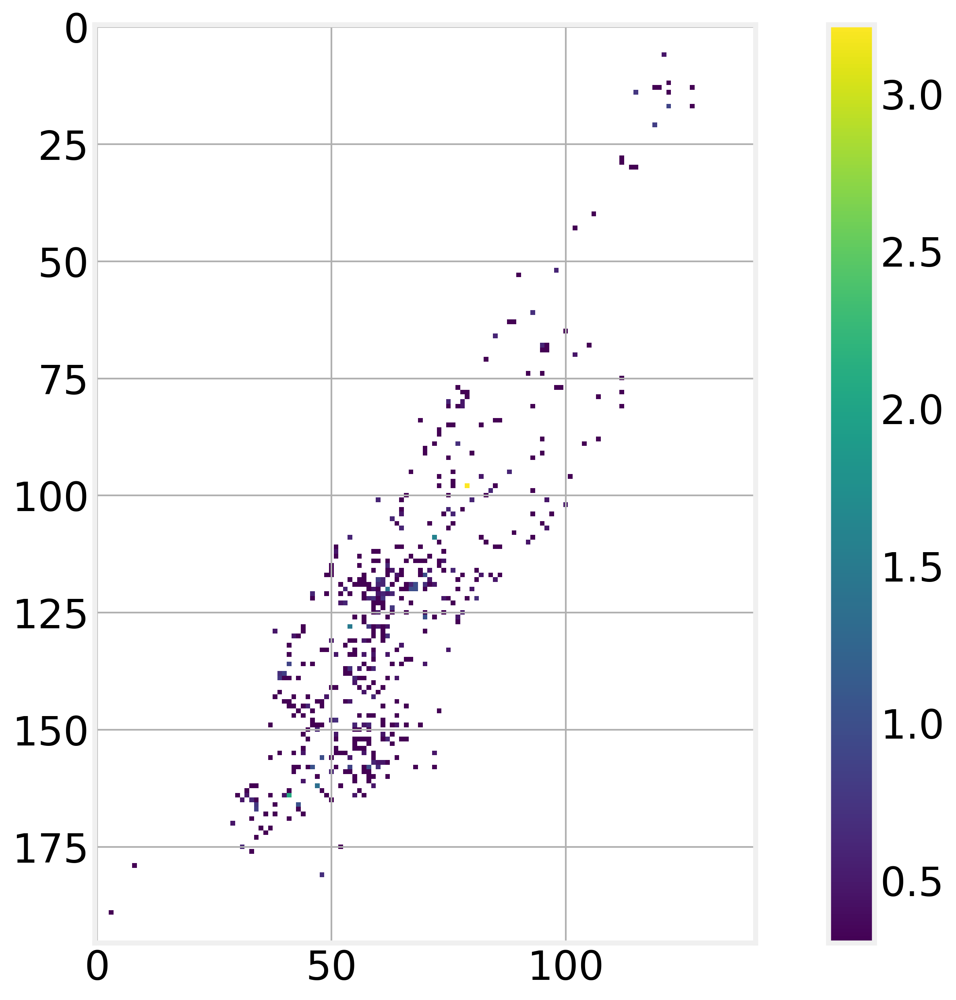

In [32]:
plt.imshow(np.log10(data+1))
plt.colorbar()

Naturally we can also add the boundary information. Reload the data

In [33]:
manhattan = json.loads(open("data/Manhattan.json", "rt").readline())

points = np.array(manhattan["points"])
parts = manhattan["parts"]

Generate the joint plot. Here we use the **extent** parameter to redifine the x,y axis coordinates to be lat and lon. 

(-74.0477296269704, -73.9066509953948, 40.68291694544512, 40.87903804730722)

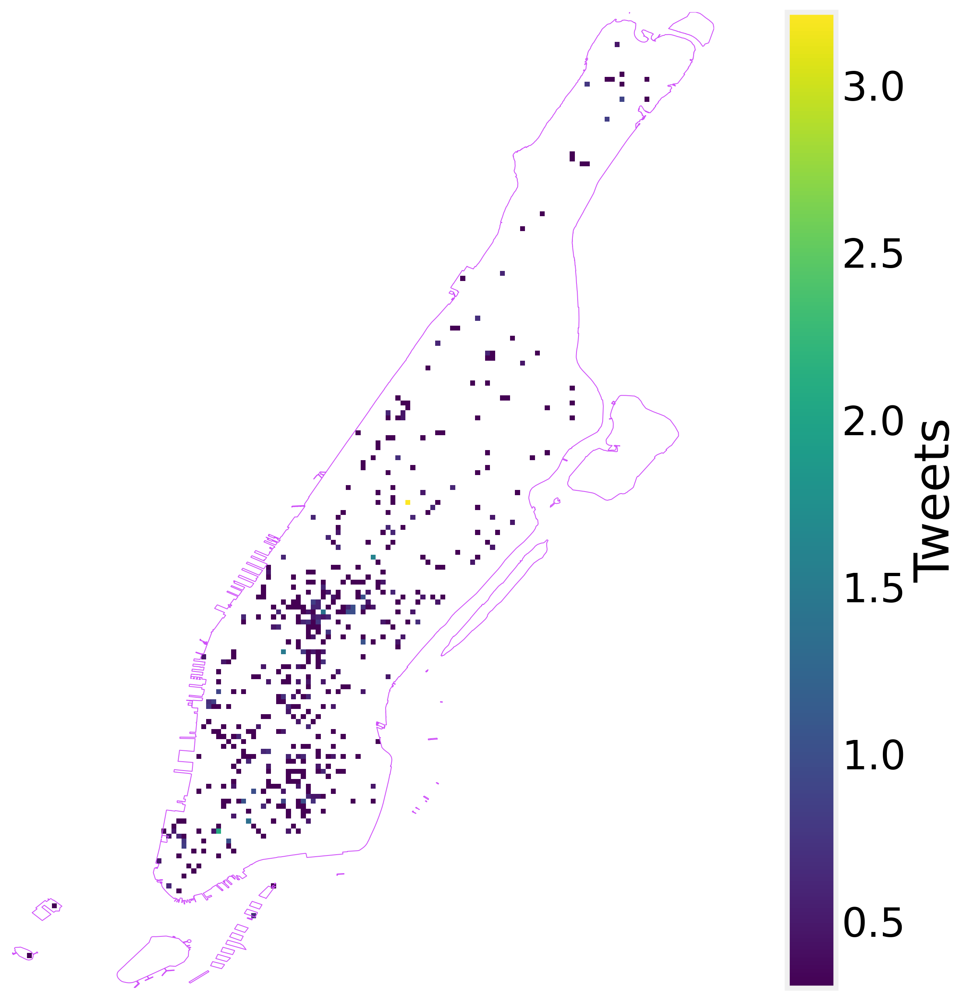

In [34]:
plt.imshow(np.log10(data+1), extent=(xllcorner, xurcorner, yllcorner, yurcorner))

for i in range(len(parts)-1):
	plt.plot(points.T[0][parts[i]:parts[i+1]], points.T[1][parts[i]:parts[i+1]], '-', c=colors[1], lw=0.5)

plt.colorbar(label='Tweets')
plt.axis('off')

## Cartopy

**Cartopy** is a Python package that leverages **matplotlib** and is built specifically to easily handle the mapping of geographical information. Plotting a minimalistic map of the world takes just a couple of lines.

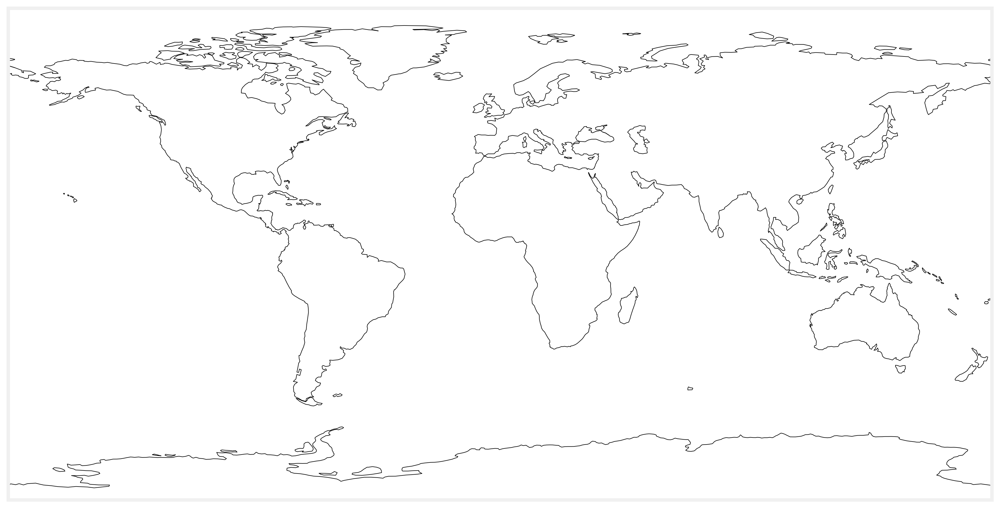

In [35]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

We can also use different projections and select only part of the map

In [36]:
dir(ccrs)

['ABCMeta',
 'Aitoff',
 'AlbersEqualArea',
 'AzimuthalEquidistant',
 'CRS',
 'EckertI',
 'EckertII',
 'EckertIII',
 'EckertIV',
 'EckertV',
 'EckertVI',
 'EqualEarth',
 'EquidistantConic',
 'EuroPP',
 'GOOGLE_MERCATOR',
 'Geocentric',
 'Geodetic',
 'Geostationary',
 'Globe',
 'Gnomonic',
 'Hammer',
 'InterruptedGoodeHomolosine',
 'LambertAzimuthalEqualArea',
 'LambertConformal',
 'LambertCylindrical',
 'Mercator',
 'Miller',
 'Mollweide',
 'NearsidePerspective',
 'NorthPolarStereo',
 'OSGB',
 'OSNI',
 'ObliqueMercator',
 'OrderedDict',
 'Orthographic',
 'PlateCarree',
 'ProjError',
 'Projection',
 'Robinson',
 'RotatedGeodetic',
 'RotatedPole',
 'Sinusoidal',
 'SouthPolarStereo',
 'Stereographic',
 'Transformer',
 'TransverseMercator',
 'UTM',
 'WGS84_SEMIMAJOR_AXIS',
 'WGS84_SEMIMINOR_AXIS',
 '_BoundaryPoint',
 '_CRS',
 '_CylindricalProjection',
 '_Eckert',
 '_RectangularProjection',
 '_Satellite',
 '_WarpedRectangularProjection',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__docume

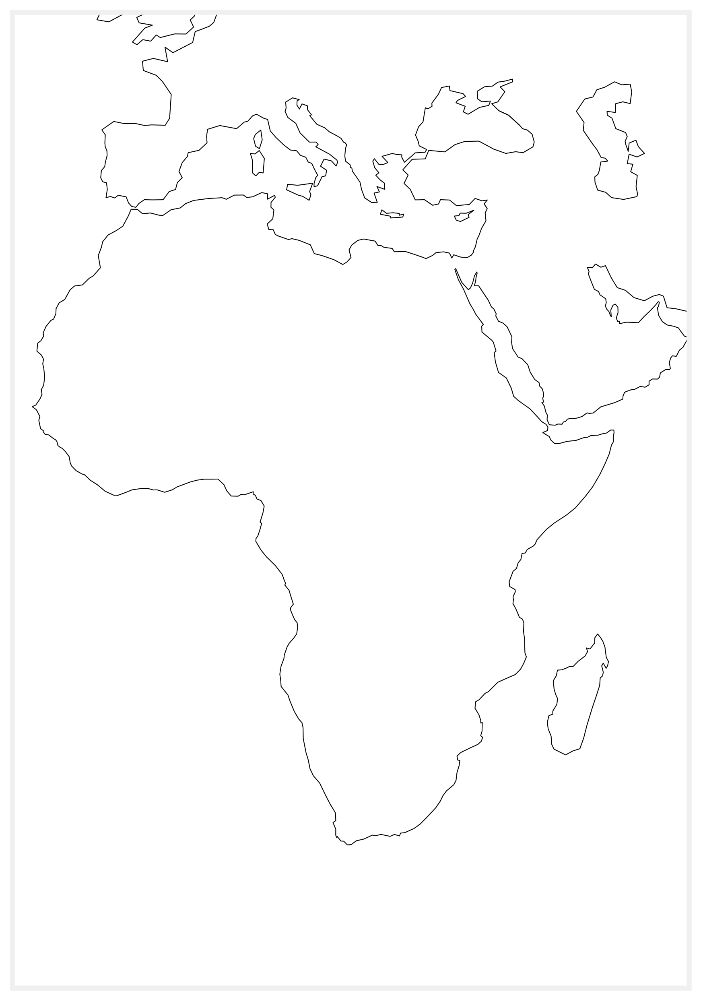

In [37]:
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([-20, 60, -40, 45])
ax.coastlines()

And add a wide range of features

In [38]:
dir(cartopy.feature)

['ABCMeta',
 'AdaptiveScaler',
 'BORDERS',
 'COASTLINE',
 'COLORS',
 'Feature',
 'GSHHSFeature',
 'LAKES',
 'LAND',
 'NaturalEarthFeature',
 'OCEAN',
 'RIVERS',
 'STATES',
 'Scaler',
 'ShapelyFeature',
 'WFSFeature',
 '_NATURAL_EARTH_GEOM_CACHE',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'abstractmethod',
 'auto_scaler',
 'cartopy',
 'np',
 'sgeom',
 'shapereader']

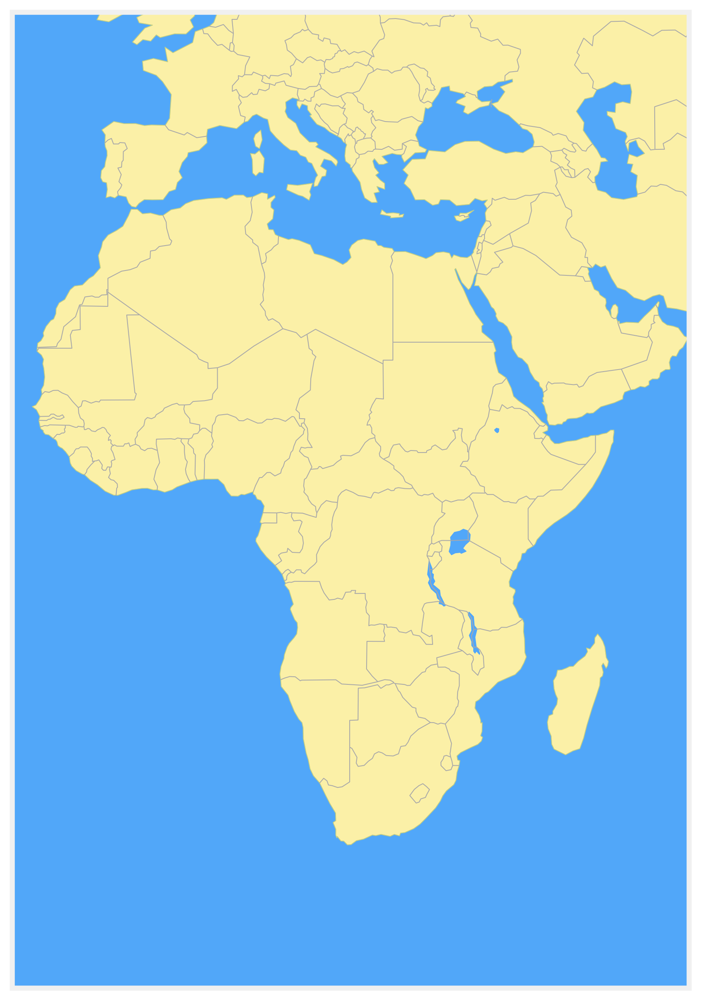

In [39]:
ax = plt.axes(projection=ccrs.Mercator())
ax.set_extent([-20, 60, -40, 45])

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=.5)

And draw great circles connecting points on the map.

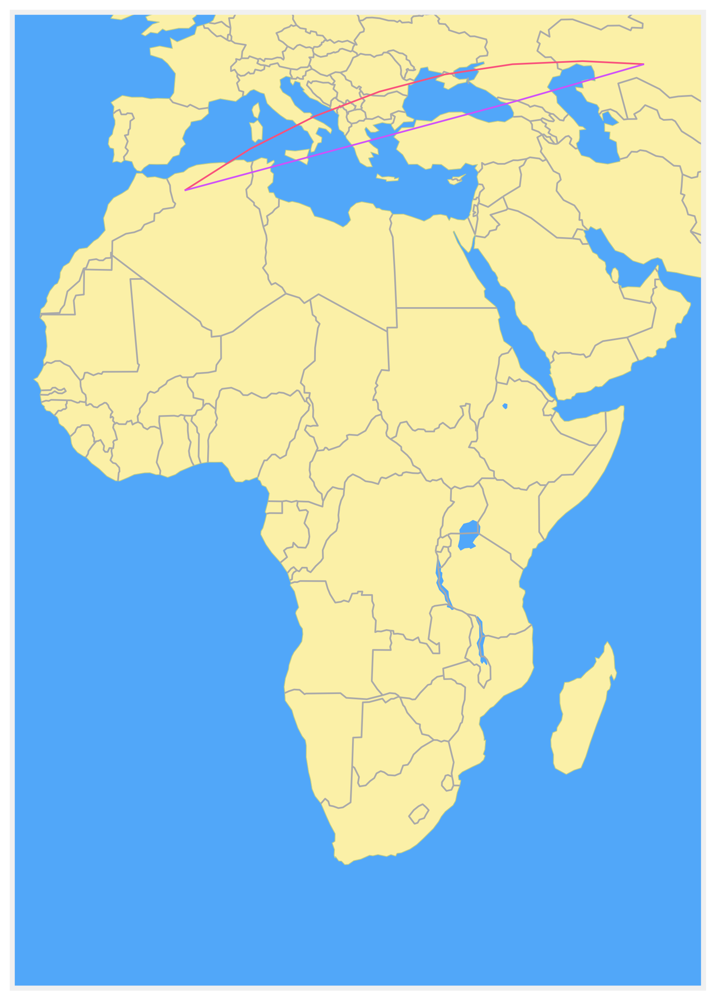

In [40]:
ax = plt.axes(projection=ccrs.Robinson())
ax.set_extent([-20, 60, -40, 45])

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

ax.plot([0, 60], [34, 47], colors[5],  transform=ccrs.Geodetic(), lw=1)
ax.plot([0, 60], [34, 47], colors[1],  transform=ccrs.PlateCarree(), lw=1)

Easily add parallels and meridians

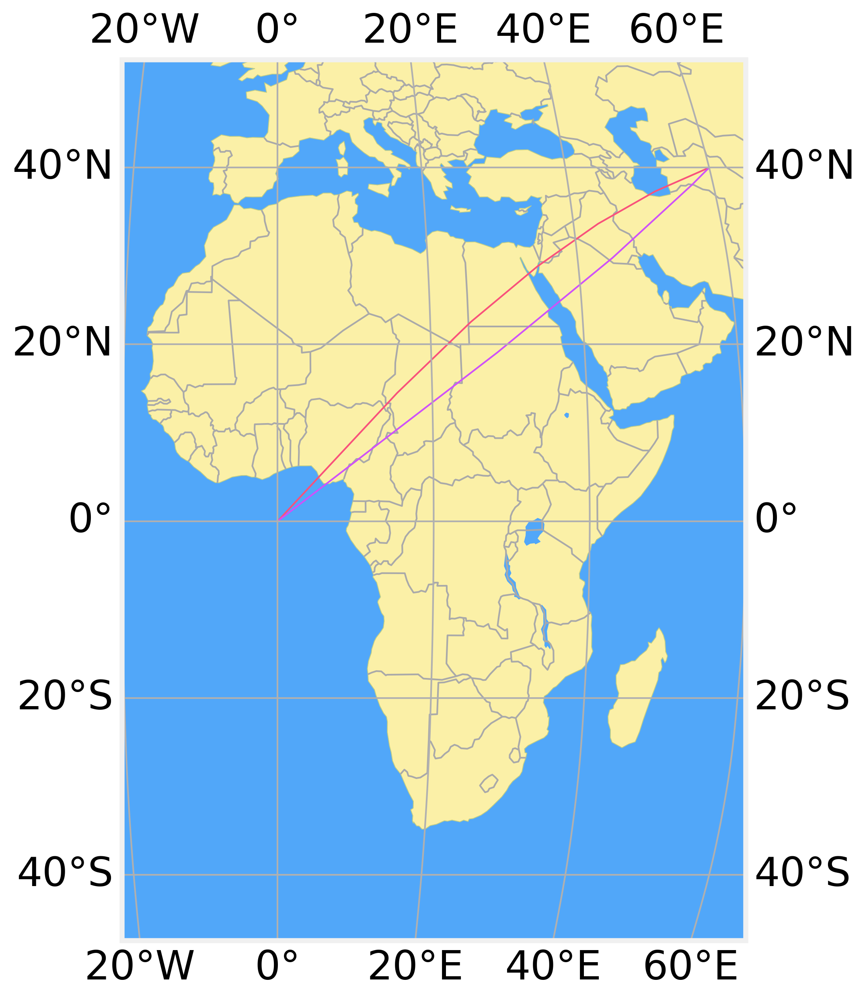

In [41]:
ax = plt.axes(projection=ccrs.Robinson())
ax.set_extent([-20, 60, -40, 45])

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

ax.plot([0, 60], [0, 40], colors[5],  transform=ccrs.Geodetic(), lw=1)
ax.plot([0, 60], [0, 40], colors[1],  transform=ccrs.PlateCarree(), lw=1)
ax.gridlines(draw_labels=True)

We can add a standard background

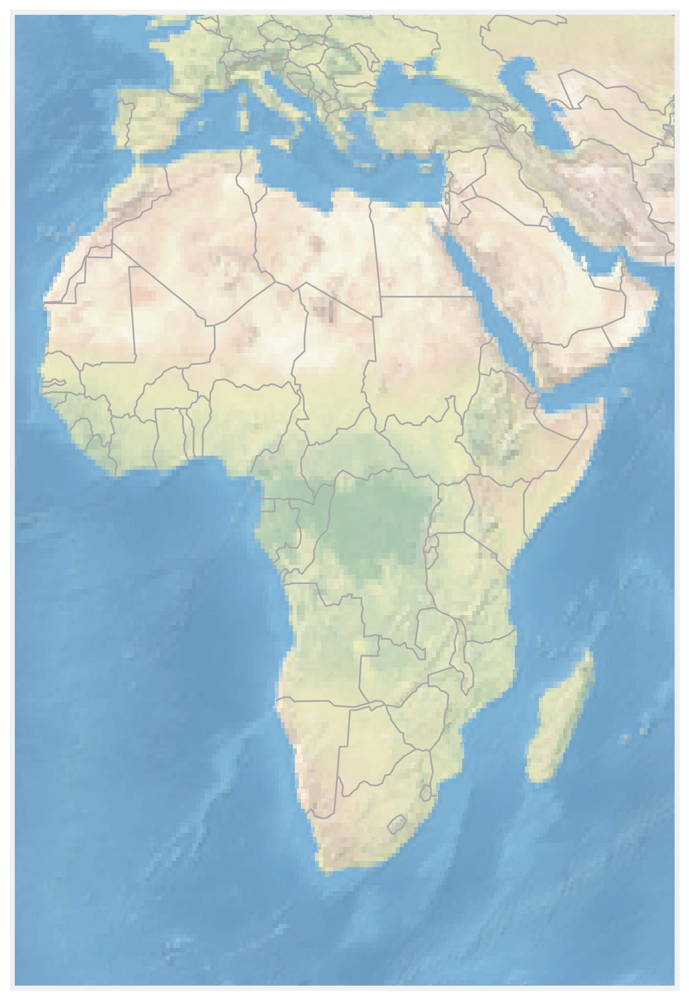

In [42]:
ax = plt.axes(projection=ccrs.Mollweide())
ax.stock_img()

ax.set_extent([-20, 60, -40, 45])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

Plot it on the globe

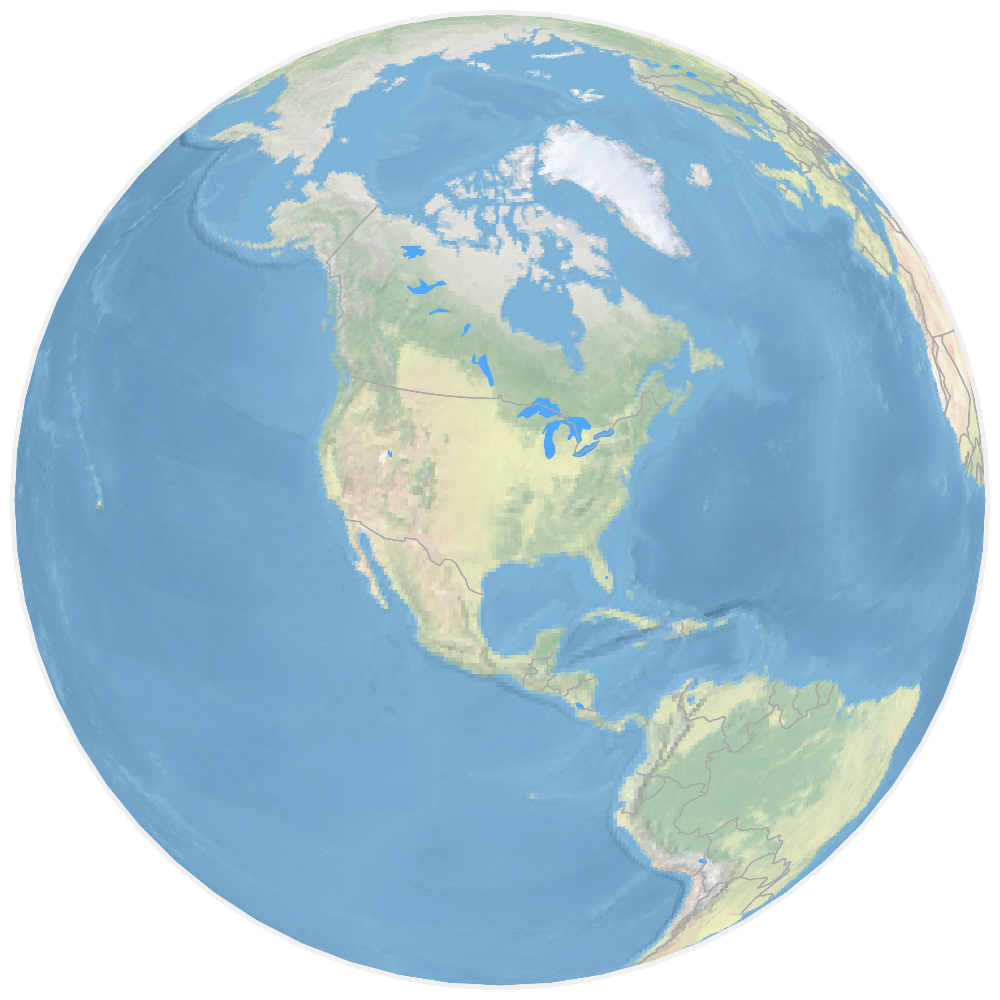

In [43]:
ax = plt.axes(projection=ccrs.Orthographic(-95, 37))
ax.stock_img()

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

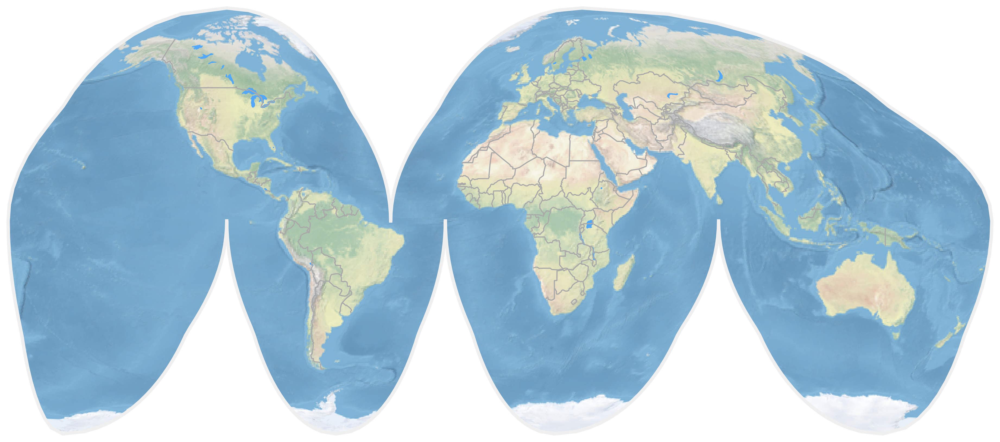

In [44]:
ax = plt.axes(projection=ccrs.InterruptedGoodeHomolosine())
ax.stock_img()

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

including the great circles

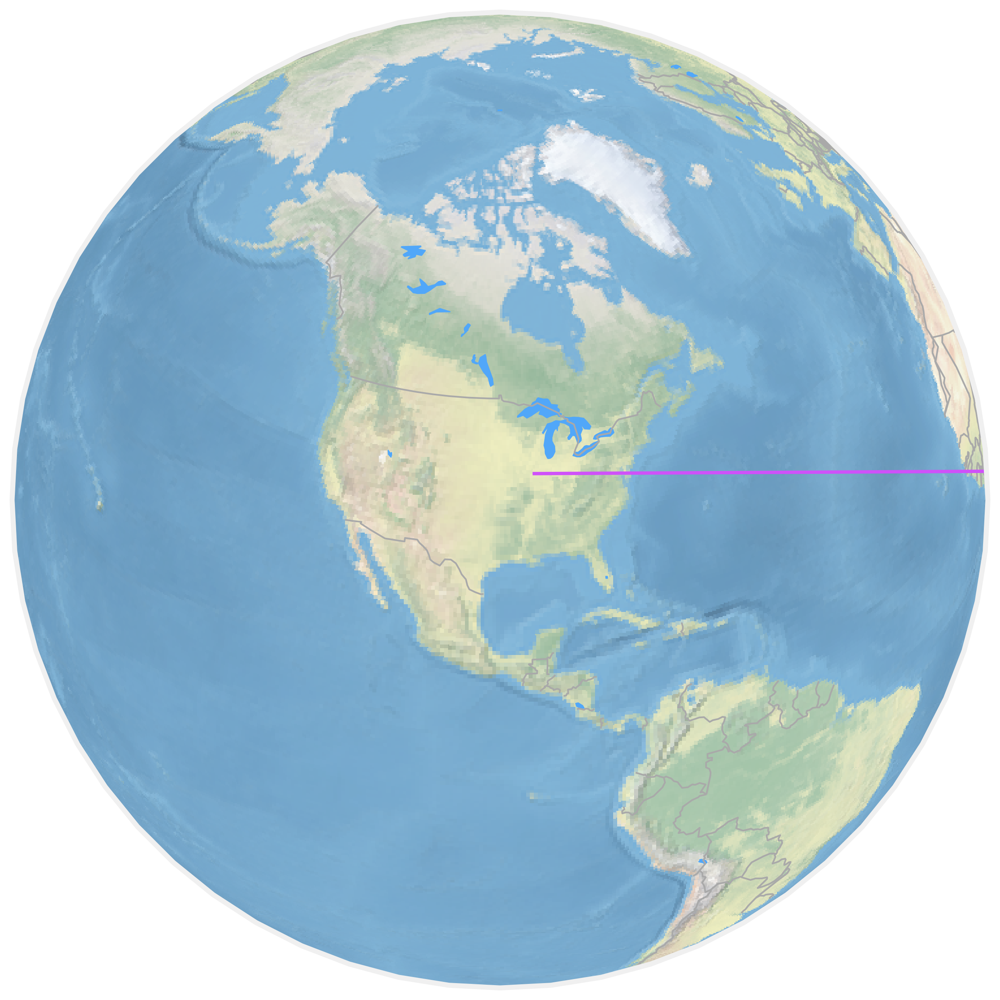

In [45]:
ax = plt.axes(projection=ccrs.Orthographic(-95, 37))
ax.stock_img()

# Draw the oceans
ax.add_feature(cartopy.feature.OCEAN, color=colors[0])

# Draw the continents
ax.add_feature(cartopy.feature.LAND, color=colors[4], alpha=0.5)

# Draw major lakes
ax.add_feature(cartopy.feature.LAKES, color=colors[0])

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='darkgray', lw=1)

ax.plot([0, -90], [0, 40], colors[1],  transform=ccrs.Geodetic(), lw=2)

# Airport Data

As before, we load the airport information from the 'Master Coordinate' dataset downloaded from [BTS](https://www.transtats.bts.gov/Tables.asp?DB_ID=595&DB_Name=Aviation%20Support%20Tables&DB_Short_Name=Aviation%20Support%20Tables). Here we are only interested in 4 fields

In [46]:
airports = pd.read_csv('data/336781026_T_MASTER_CORD.zip', 
                       usecols=['AIRPORT', 'LATITUDE', 'LONGITUDE', 'AIRPORT_IS_LATEST'])

The _AIRPORT_IS_LATEST_ field represents the most recent coordinates for a given airport (coordinates can change when airports move to a new location in order to expand). We make sure to pick always the most recent coordinates

In [47]:
airports.set_index('AIRPORT').loc['JFK']

,LATITUDE,LONGITUDE,AIRPORT_IS_LATEST
AIRPORT,,,
JFK,40.638611,-73.776944,0
JFK,40.639722,-73.778889,0
JFK,40.640000,-73.778611,0
JFK,40.639722,-73.778889,0
JFK,40.640000,-73.778611,1


We filter out just the most recent set of coordinates

In [48]:
airports = airports[airports.AIRPORT_IS_LATEST==1].drop(columns=['AIRPORT_IS_LATEST'])

So we have over 6,500 airports as the BTS database includes airports all over the world. 

In [49]:
airports.shape

(6553, 3)

And we can generate a quick visualization of their locations

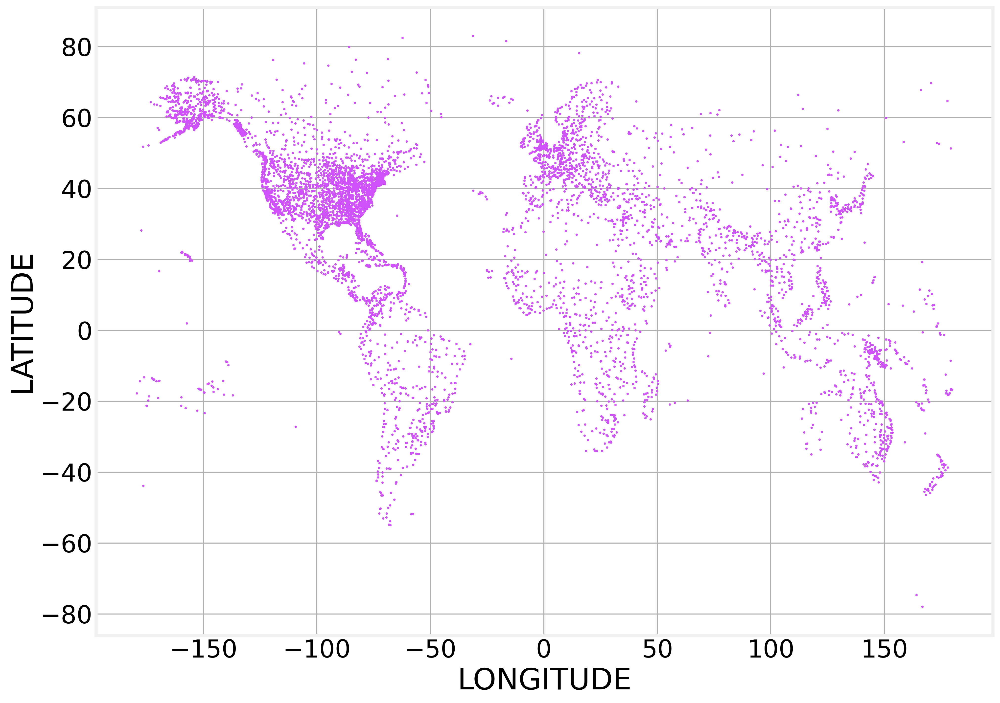

In [50]:
# Longitude corresponds to the x-axis and Latitude to the y-axis.
airports.plot(x='LONGITUDE', y='LATITUDE', kind='scatter', color=colors[1], s=3)
fig = plt.gcf()
fig.set_size_inches(14, 10)

Where we can imediately recognize the shapes of the continents. Now we load a nice background images from Nasa so that we can use it as a "texture" for our globe. Feel free to use another background. NASA makes a few dozen available [here](https://visibleearth.nasa.gov/collection/1484/blue-marble)

In [51]:
img = PIL.Image.open('data/eo_base_2020_clean_720x360.jpg')

Let's take a quick look

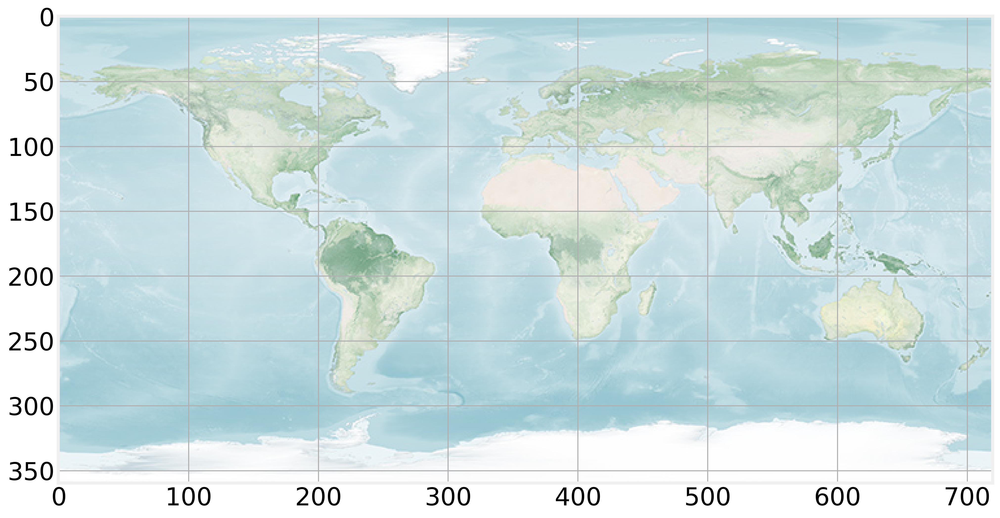

In [52]:
plt.imshow(img)
plt.gcf().set_size_inches(14, 10)

Not to shaby. Now we can add it to the surface of our globe using __imshow__ and cartopy to handle the projection

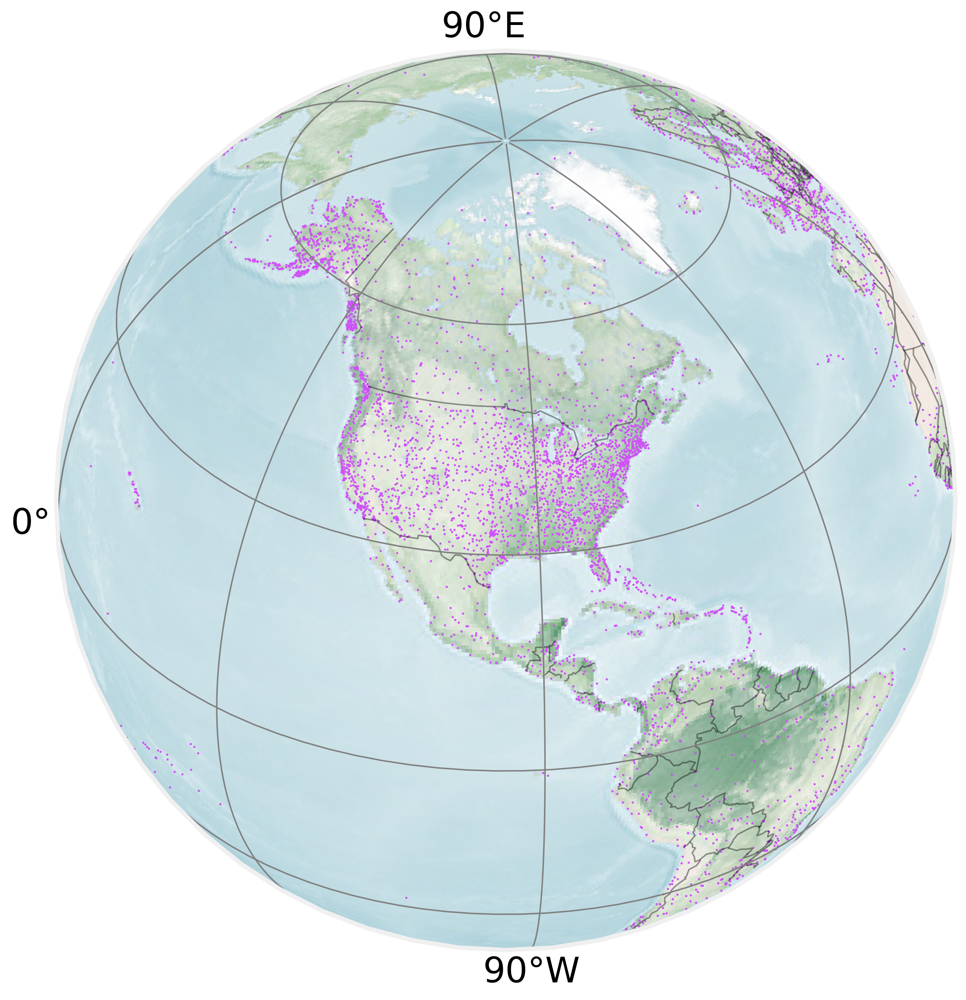

In [53]:
ax = plt.axes(projection=ccrs.Orthographic(-95, 37))
fig = plt.gcf()

# Add the blue marble figure as a "texture" on top of the globe
ax.imshow(img, origin="upper", extent=(-180, 180, -90, 90),
          # Tell cartopy what the original projection of the data is
          transform=ccrs.PlateCarree())  

# Draw country borders
ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', lw=1, alpha=0.4)

# Add longitude and latitude grid lines
ax.gridlines(draw_labels=True, dms=True, 
             xlocs=np.arange(-180, 180.1, 45), 
             ylocs=np.arange(-90, 90.1, 30),
             x_inline=False, y_inline=False, color='gray')


# Longitude corresponds to the x-axis and Latitude to the y-axis.
airports.plot(x='LONGITUDE', y='LATITUDE', kind='scatter', color=colors[1], 
              s=1, ax=ax, 
              # Tell cartopy what the original projection of the data is
              transform=ccrs.PlateCarree())

fig.set_size_inches(14, 10)

<div style="width: 100%; overflow: hidden;">
     <img src="data/D4Sci_logo_full.png" alt="Data For Science, Inc" align="center" border="0" width=300px> 
</div>